In [1]:
import pandas as pd; pd.options.mode.chained_assignment = None
import numpy as np

# Built In Imports
from datetime import datetime
from glob import glob
import warnings
import IPython
import urllib
import zipfile
import pickle
import shutil
import string
import math
import tqdm
import time
import os
import gc
import re

# Visualization Imports
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import matplotlib
import plotly
import PIL
import cv2
from pycocotools.coco import COCO

# Other Imports
from tqdm.notebook import tqdm

import json

LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in sns.color_palette("Spectral", 10)]
LABEL_COLORS_WOUT_NO_FINDING = LABEL_COLORS[:8]+LABEL_COLORS[9:]

In [2]:
miss_annotation_id_lists = []
miss_image_id_lists = []

In [3]:
#file_path = '../../dataset/train.json'
file_path = './trimtrain.json'

coco = COCO(file_path)

with open(file_path, "r") as json_file:
    json_data = json.load(json_file)
    print(json_data)
    
    
train_df = pd.DataFrame()

image_ids = []
class_name = []
class_id = []
x_min = []
y_min = []
x_max = []
y_max = []
annid = []
classes = ["General trash", "Paper", "Paper pack", "Metal", "Glass", 
           "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]
for image_id in coco.getImgIds():
        
    image_info = coco.loadImgs(image_id)[0]
    ann_ids = coco.getAnnIds(imgIds=image_info['id'])
    anns = coco.loadAnns(ann_ids)
        
    file_name = image_info['file_name']
        
    for ann in anns:
        image_ids.append(file_name)
        class_name.append(classes[ann['category_id']])
        class_id.append(ann['category_id'])
        x_min.append(float(ann['bbox'][0]))
        y_min.append(float(ann['bbox'][1]))
        x_max.append(float(ann['bbox'][0]) + float(ann['bbox'][2]))
        y_max.append(float(ann['bbox'][1]) + float(ann['bbox'][3]))
        annid.append(ann['id'])

train_df['image_id'] = image_ids
train_df['class_name'] = class_name
train_df['class_id'] = class_id
train_df['x_min'] = x_min
train_df['y_min'] = y_min
train_df['x_max'] = x_max
train_df['y_max'] = y_max
train_df['ann_id'] = annid

train_df['area'] = ((train_df['y_max'] - train_df['y_min'])*(train_df['x_max'] - train_df['x_min']))
train_df['invarea'] = 1/((train_df['y_max'] - train_df['y_min'])*(train_df['x_max'] - train_df['x_min']))
train_df['whratio'] = (train_df['x_max'] - train_df['x_min']) / (train_df['y_max'] - train_df['y_min'])
train_df['hwratio'] = (train_df['y_max'] - train_df['y_min']) / (train_df['x_max'] - train_df['x_min'])



IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [4]:
train_df.tail(10)

,image_id,class_name,class_id,x_min,y_min,x_max,y_max,ann_id,area,invarea,whratio,hwratio
22644,train/4880.jpg,General trash,0,193.3,209.2,769.7,846.6,23134,367397.36,0.000003,0.904299,1.105829
22645,train/4881.jpg,Plastic bag,7,114.5,45.2,866.2,518.1,23135,355478.93,0.000003,1.589554,0.629107
22646,train/4881.jpg,Plastic bag,7,724.0,69.1,769.0,111.8,23136,1921.50,0.000520,1.053864,0.948889
22647,train/4881.jpg,Paper,1,279.0,459.7,443.6,567.9,23137,17809.72,0.000056,1.521257,0.657351
22648,train/4881.jpg,Plastic bag,7,151.4,484.8,691.5,858.9,23138,202051.41,0.000005,1.443732,0.692650
22649,train/4882.jpg,Plastic,5,0.0,116.2,944.1,930.3,23139,768591.81,0.000001,1.159686,0.862303
22650,train/4882.jpg,Plastic bag,7,302.1,439.3,567.3,655.4,23140,57309.72,0.000017,1.227210,0.814857
22651,train/4882.jpg,General trash,0,511.3,451.1,570.0,481.3,23141,1772.74,0.000564,1.943709,0.514480
22652,train/4882.jpg,Paper,1,255.0,421.4,526.7,616.5,23142,53008.67,0.000019,1.392619,0.718071
22653,train/4882.jpg,Paper,1,145.4,295.4,565.6,651.5,23143,149633.22,0.000007,1.180006,0.847454


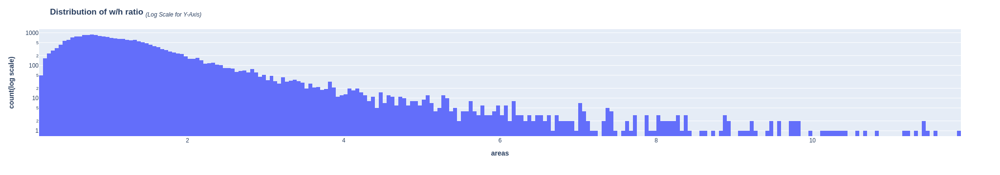

In [5]:
fig = px.histogram(train_df, x="whratio", log_y=True)
fig.update_layout(showlegend=False,
                  xaxis_title="<b>areas</b>",
                  yaxis_title="<b>count(log scale)</b>",                   
                  title="<b>Distribution of w/h ratio </b>"
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.show()

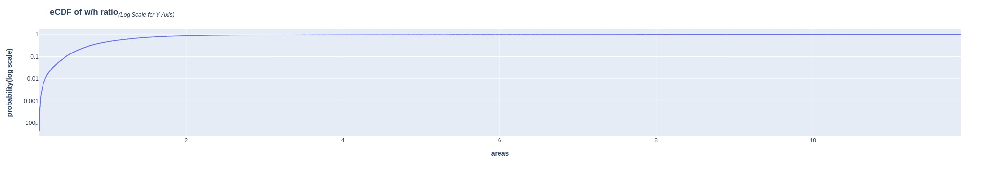

In [6]:
fig = px.ecdf(train_df, x="whratio", log_y=True)
fig.update_layout(showlegend=False,
                  xaxis_title="<b>areas</b>",
                  yaxis_title="<b>probability(log scale)</b>",                   
                  title="<b>eCDF of w/h ratio</b>"
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.show()

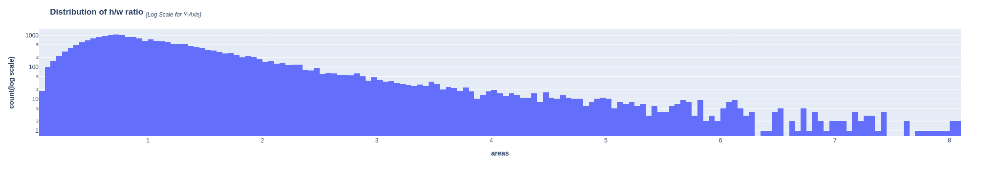

In [7]:
fig = px.histogram(train_df, x="hwratio", log_y=True)
fig.update_layout(showlegend=False,
                  xaxis_title="<b>areas</b>",
                  yaxis_title="<b>count(log scale)</b>",                   
                  title="<b>Distribution of h/w ratio </b>"
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.show()

In [8]:
threshold = 12
print("whratio threshold :", threshold)
train_df.where(train_df['whratio'] >= threshold).value_counts()

whratio threshold : 12


Series([], dtype: int64)

In [9]:
miss_annotation_id_lists.extend((train_df.loc[train_df['whratio'] >= threshold])['ann_id'].values.tolist())

In [10]:
miss_annotation_id_lists = list(set(miss_annotation_id_lists))
print(len(miss_annotation_id_lists))
print(miss_annotation_id_lists)

0
[]


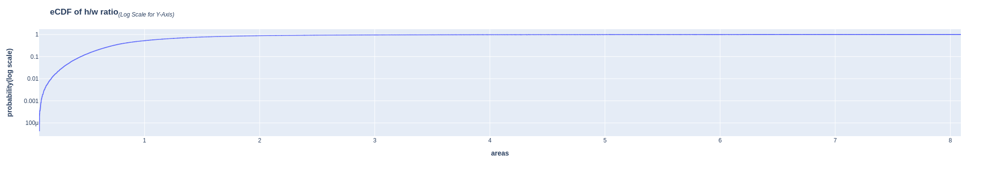

In [11]:
fig = px.ecdf(train_df, x="hwratio", log_y=True)
fig.update_layout(showlegend=False,
                  xaxis_title="<b>areas</b>",
                  yaxis_title="<b>probability(log scale)</b>",                   
                  title="<b>eCDF of h/w ratio</b>"
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.show()

In [12]:
threshold = 8.2
print("hwratio threshold :", threshold)
train_df.where(train_df['hwratio'] >= threshold).value_counts()

hwratio threshold : 8.2


Series([], dtype: int64)

In [13]:
miss_annotation_id_lists.extend((train_df.loc[train_df['hwratio'] >= threshold])['ann_id'].values.tolist())

In [14]:
miss_annotation_id_lists = list(set(miss_annotation_id_lists))
print(len(miss_annotation_id_lists))
print(miss_annotation_id_lists)

0
[]


area 분석

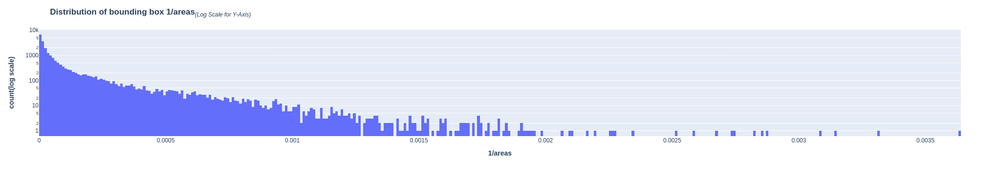

In [15]:
fig = px.histogram(train_df, x="invarea", log_y=True)
fig.update_layout(showlegend=False,
                  xaxis_title="<b>1/areas</b>",
                  yaxis_title="<b>count(log scale)</b>",                   
                  title="<b>Distribution of bounding box 1/areas</b>"
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.show()

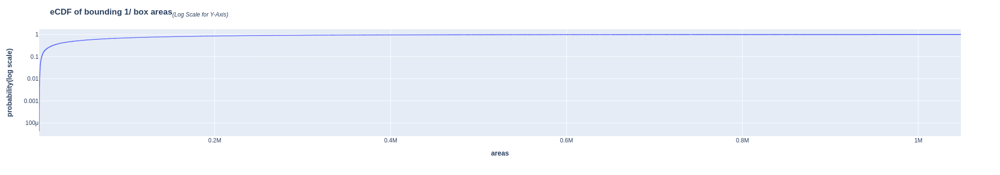

In [16]:
fig = px.ecdf(train_df, x="area", log_y=True)
fig.update_layout(showlegend=False,
                  xaxis_title="<b>areas</b>",
                  yaxis_title="<b>probability(log scale)</b>",                   
                  title="<b>eCDF of bounding 1/ box areas</b>"
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.show()

과도하게 작은 box는 제거한다. 전체 데이터 수의 0.1%이하가 되도록 area 결정

In [17]:
threshold = 1 /(15*15)
print("area threshold :", threshold)
train_df.where(train_df['invarea'] > threshold).value_counts()

area threshold : 0.0044444444444444444


Series([], dtype: int64)

In [18]:
miss_annotation_id_lists.extend((train_df.loc[train_df['invarea'] >= threshold])['ann_id'].values.tolist())

In [19]:
miss_annotation_id_lists = list(set(miss_annotation_id_lists))
print(len(miss_annotation_id_lists))
print(miss_annotation_id_lists)

0
[]


동일한 image에 대한 annotation수

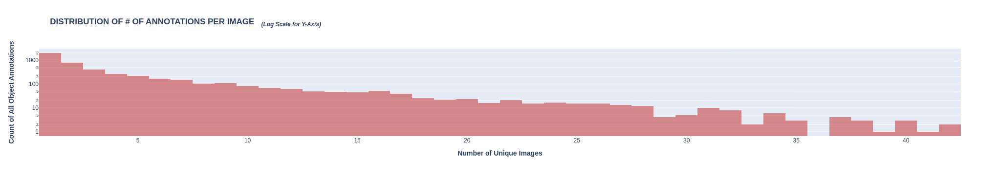

In [20]:
fig = px.histogram(train_df.image_id.value_counts(), 
                   log_y=True, color_discrete_sequence=['indianred'], opacity=0.7,
                   labels={"value":"Number of Annotations Per Image"},
                   title="<b>DISTRIBUTION OF # OF ANNOTATIONS PER IMAGE   "
                         "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique Images</b>",
                  yaxis_title="<b>Count of All Object Annotations</b>",)
fig.show()

이미지당 annotation이 지나치게 많은 사진 + annotation은 삭제

In [21]:
image_id_count = train_df.image_id.value_counts()

In [22]:
threshold = 44
print("annotations threshold :", threshold)
image_id_count.loc[image_id_count >= threshold]

annotations threshold : 44


Series([], Name: image_id, dtype: int64)

In [23]:
miss_image_id_lists = (image_id_count.loc[image_id_count >= threshold]).index.to_list()

선택된 img 와 annotation 삭제 및 json 저장

In [24]:
print(len(miss_image_id_lists))
print(miss_image_id_lists)

0
[]


In [25]:
miss_annotation_id_lists = list(set(miss_annotation_id_lists))
print(len(miss_annotation_id_lists))
print(miss_annotation_id_lists)

0
[]


In [26]:
# 삭제할img와 연결된 모든 annotation 도 삭제목록에 추가
for miss_image_id_list in miss_image_id_lists:
    miss_annotation_id_lists.extend((train_df.loc[train_df['image_id'] == miss_image_id_list]).index.values.tolist())

In [27]:
miss_annotation_id_lists = list(set(miss_annotation_id_lists))
print(len(miss_annotation_id_lists))
print(miss_annotation_id_lists)

0
[]


In [28]:
for i, json_data_img in enumerate(json_data["images"]):
    if (json_data_img['file_name'] == 'train/4041.jpg'):
        print(json_data["images"][i])

{'width': 1024, 'height': 1024, 'file_name': 'train/4041.jpg', 'license': 0, 'flickr_url': None, 'coco_url': None, 'date_captured': '2020-12-27 17:27:15', 'id': 4041}


In [29]:
HERE

NameError: name 'HERE' is not defined

In [ ]:
def deleteimagejson(file_names):
    for file_name in reversed(file_names):
        #print(file_name)
        for i, json_data_img in enumerate(json_data["images"]):
            if (json_data_img['file_name'] == file_name):
                del json_data["images"][i]

In [ ]:
deleteimagejson(miss_image_id_lists)

In [ ]:
def deleteannotationjson(annotaionindexs):
    for annotaionindex in reversed(annotaionindexs):
        #print(annotaionindex)
        for i, json_data_img in enumerate(json_data["annotations"]):
            if (json_data_img['id'] == annotaionindex):
                del json_data["annotations"][i]

In [ ]:
deleteannotationjson(miss_annotation_id_lists)

In [ ]:
file_path = "./trimtrain.json"
with open(file_path, 'w') as outfile:
    json.dump(json_data, outfile)

In [ ]:
#json_data